In [1]:
%pylab inline
import imageio
import numpy as np
from scipy import io, fftpack
pylab.rcParams['figure.figsize'] = (20, 20)

Populating the interactive namespace from numpy and matplotlib


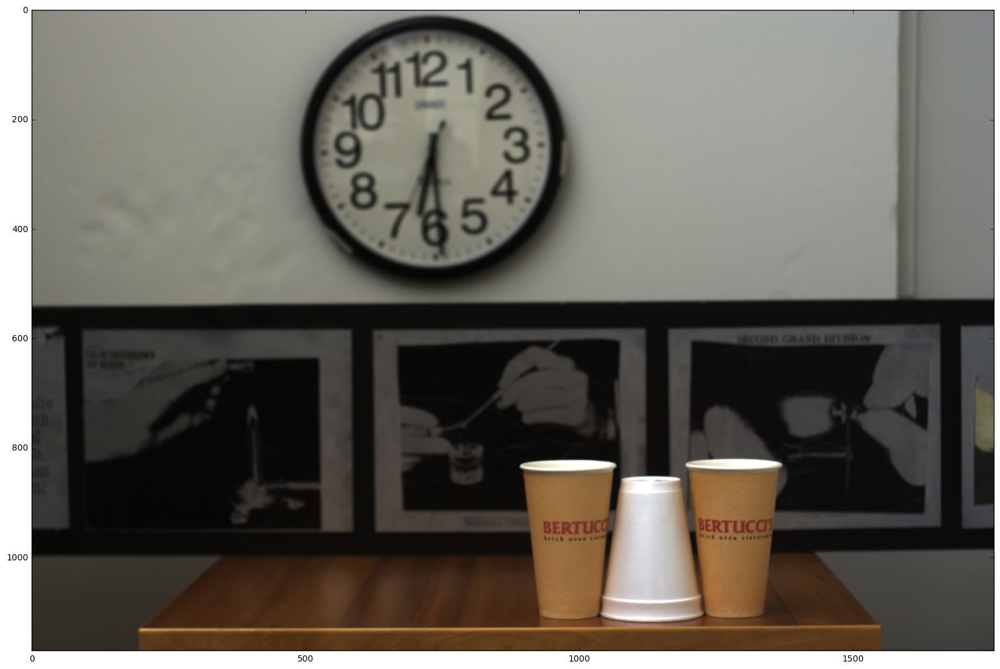

In [3]:
DEPTH_COUNT = 9
DERIVATIVE_VARIANCE = 250
NOISE_VARIANCE = 0.005

DepthFilters = []
for i in range(DEPTH_COUNT):
    filterFName = './CodedApertureData/filts/filt_scl%02d.mat' % (i + 1)
    DepthFilters.append(io.loadmat(filterFName)['filts'])

Image = imageio.imread('./CodedApertureData/cups_board_inp.bmp')
imshow(Image)

(1171, 1758, 3) (1171, 1758, 3)


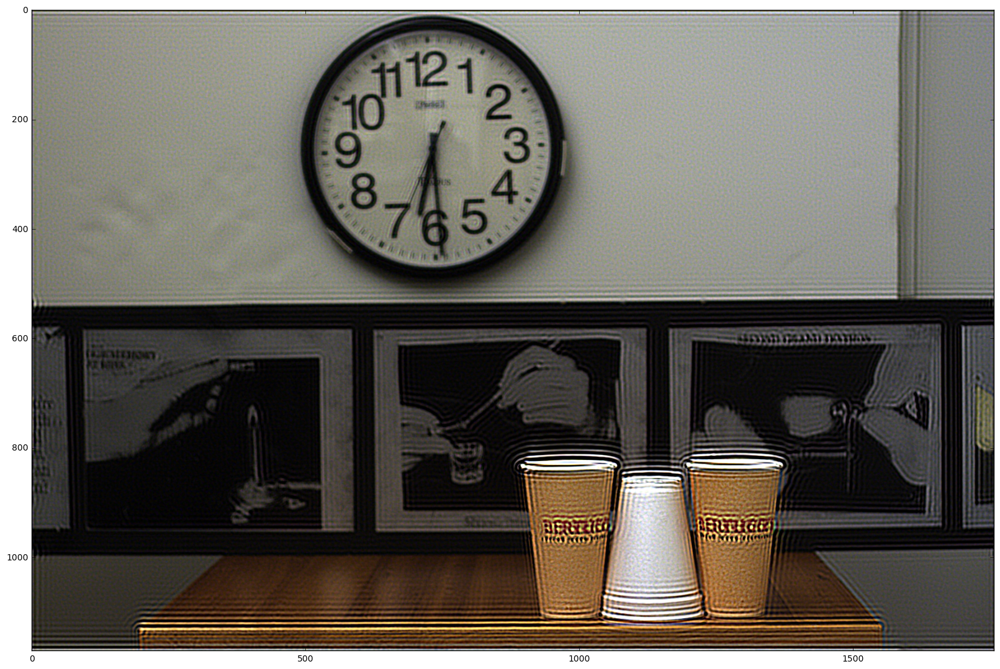

In [44]:
def DeconvoluteGaussianChan(ConvolutedImage, Kernel, Weight):    
    PadH, PadW = Kernel.shape
    PadH /= 2
    PadW /= 2
    
    Image = np.pad(ConvolutedImage, ((PadH, PadH), (PadW, PadW)), 'reflect')
    Height, Width = Image.shape
    Kernel = np.fliplr(np.flipud(Kernel))
    
    F = fftpack.fft2(Kernel, (Height, Width))
    Gx = fftpack.fft2(np.array([[-1, 1]]), (Height, Width))
    Gy = fftpack.fft2(np.array([[-1], [1]]), (Height, Width))
    ImageFreq = fftpack.fft2(Image)
    
    Fconj = np.conj(F)
    
    A = (Fconj * F) + Weight * (np.conj(Gx) * Gx + np.conj(Gy) * Gy)
    b = Fconj * ImageFreq

    ClearImageFreq = b / A
    
    ClearImage = fftpack.ifft2(ClearImageFreq)
    return np.real(ClearImage[0:-(PadH*2), 0:-(PadW*2)]) / 255.0

def DeconvoluteGaussian(ConvolutedImage, Kernel, Weight = DERIVATIVE_VARIANCE * (NOISE_VARIANCE ** 2)):
    R = DeconvoluteGaussianChan(ConvolutedImage[:, :, 0], Kernel, Weight)
    G = DeconvoluteGaussianChan(ConvolutedImage[:, :, 1], Kernel, Weight)
    B = DeconvoluteGaussianChan(ConvolutedImage[:, :, 2], Kernel, Weight)
    
    return np.dstack([R, G, B])

Result = DeconvoluteGaussian(Image, DepthFilters[0][0][0])
print Result.shape, Image.shape
imshow(np.clip(Result, 0, 1))

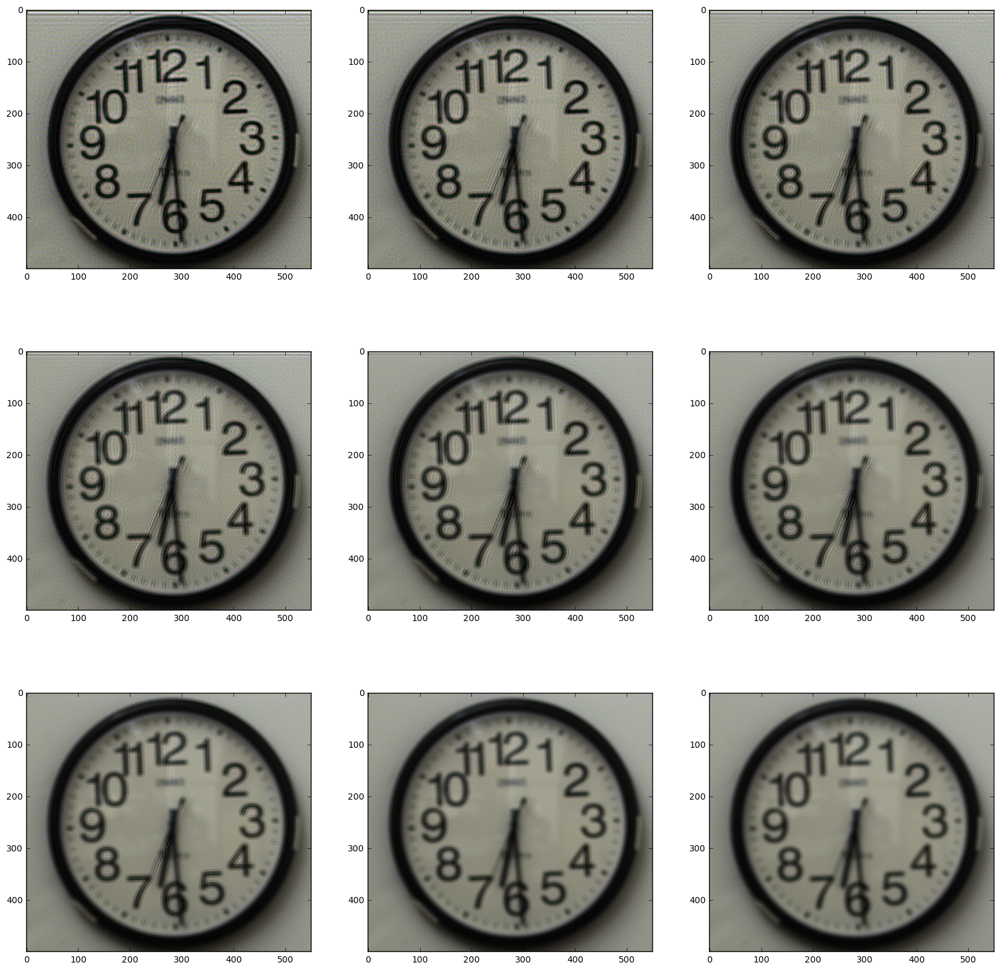

In [47]:
for i in range(DEPTH_COUNT):
    subplot(3, 3, i+1)
    img = DeconvoluteGaussian(Image, DepthFilters[i][0][0])
    np.save('img_%d_deblur' % (i + 1), img)
    imshow(np.clip(img[0:500, 450:1000, :], 0, 1))

(1171, 1758, 3) (1171, 1758, 3)


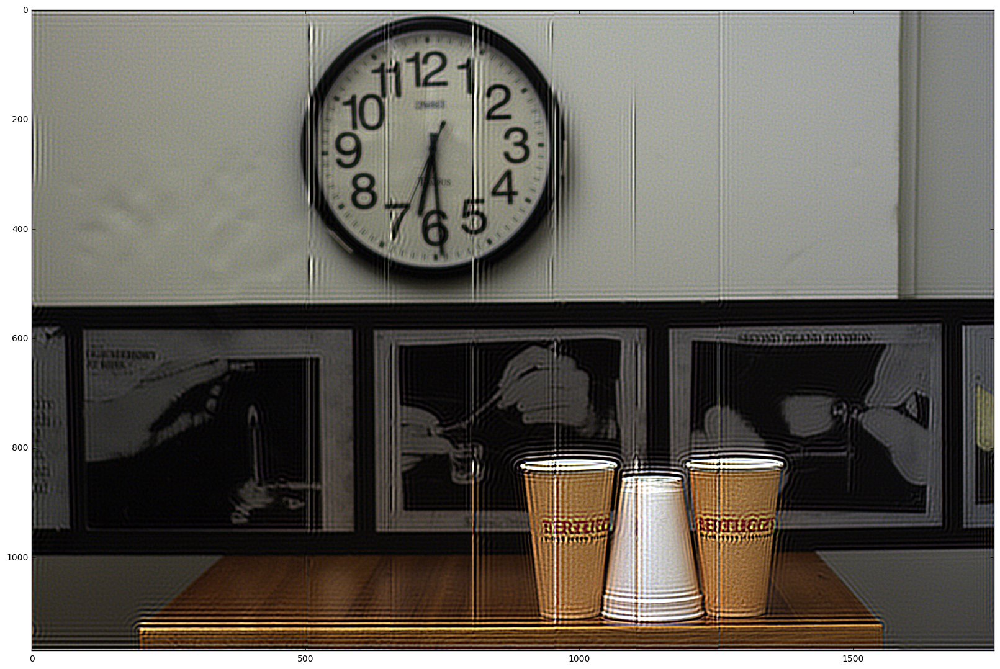

In [46]:
import math

def BetterDeconvoluteGaussian(ConvolutedImage, Kernels, Weight = DERIVATIVE_VARIANCE * (NOISE_VARIANCE ** 2)):
    CenterX = int(math.floor(ConvolutedImage.shape[1] / 2))
    Stripes = [
        [CenterX - 525, CenterX - 375],
        [CenterX - 375, CenterX - 225],
        [CenterX - 225, CenterX - 75],
        [CenterX - 75, CenterX + 75],
        [CenterX + 75, CenterX + 225],
        [CenterX + 225, CenterX + 375],
        [CenterX + 375, CenterX + 525]
    ]
    Stripes[0][0] = min(max(Stripes[0][0], 0), 0)
    Stripes[6][1] = min(max(Stripes[6][1], ConvolutedImage.shape[1]), ConvolutedImage.shape[1])

    Result = np.empty(ConvolutedImage.shape)
    
    for i in range(len(Stripes)):
        SubResult = DeconvoluteGaussian(ConvolutedImage[:, Stripes[i][0]:(Stripes[i][1])], Kernels[i], Weight)
        Result[:, Stripes[i][0]:(Stripes[i][1])] = SubResult
        
    return Result

BetterResult = BetterDeconvoluteGaussian(Image, DepthFilters[0][0])
print BetterResult.shape, Image.shape
imshow(np.clip(BetterResult, 0, 1))